In [1]:
# ============================================================
# CELL 1 — IMPORT LIBRARY & CEK ENVIRONMENT
# ============================================================

import os
import cv2
import yaml
import torch
import random
import warnings
import shutil

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from pathlib import Path
from sklearn.model_selection import train_test_split
from ultralytics import YOLO

warnings.filterwarnings("ignore")

print("=" * 60)
print("            ENVIRONMENT CHECK")
print("=" * 60)

print(f"PyTorch Version  : {torch.__version__}")
print(f"CUDA Available   : {torch.cuda.is_available()}")

if torch.cuda.is_available():

    print(f"GPU Name         : {torch.cuda.get_device_name(0)}")
    print(f"CUDA Version     : {torch.version.cuda}")

    gpu_mem = torch.cuda.get_device_properties(0).total_memory / 1e9

    print(f"GPU Memory       : {gpu_mem:.2f} GB")

else:

    print("⚠️ GPU tidak terdeteksi — menggunakan CPU")

print("=" * 60)
print("✅ Semua library berhasil diimport")

            ENVIRONMENT CHECK
PyTorch Version  : 2.7.1+cu118
CUDA Available   : True
GPU Name         : NVIDIA GeForce RTX 3050 Laptop GPU
CUDA Version     : 11.8
GPU Memory       : 4.29 GB
✅ Semua library berhasil diimport


In [ ]:
# ============================================================
# CELL 2 — SETUP DATASET PATH
# ============================================================

BASE_DIR = Path("..").resolve()

DATA_DIR = BASE_DIR / "data"

TRAIN_IMG = DATA_DIR / "train" / "images"
TRAIN_LBL = DATA_DIR / "train" / "labels"

YAML_PATH = DATA_DIR / "data.yaml"

print("=" * 60)
print("            VERIFIKASI DATASET")
print("=" * 60)

paths = {
    "train/images" : TRAIN_IMG,
    "train/labels" : TRAIN_LBL,
    "data.yaml"    : YAML_PATH
}

all_ok = True

for name, path in paths.items():

    if path.exists():
        print(f"✅ {name}")

    else:
        print(f"❌ {name}")
        all_ok = False

print("=" * 60)

if all_ok:
    print("✅ Dataset berhasil ditemukan")

else:
    print("⚠️ Ada path yang belum ditemukan")

In [2]:
# ============================================================
# OPTIONAL CELL — SETUP DATASET (FULL SPLIT VERSION)
# Gunakan cell ini jika dataset SUDAH memiliki:
# train / valid / test
# ============================================================

BASE_DIR = Path("..").resolve()

DATA_DIR = BASE_DIR / "data"

# =========================
# TRAIN
# =========================
TRAIN_IMG = DATA_DIR / "train" / "images"
TRAIN_LBL = DATA_DIR / "train" / "labels"

# =========================
# VALID
# =========================
VALID_IMG = DATA_DIR / "valid" / "images"
VALID_LBL = DATA_DIR / "valid" / "labels"

# =========================
# TEST
# =========================
TEST_IMG = DATA_DIR / "test" / "images"
TEST_LBL = DATA_DIR / "test" / "labels"

# =========================
# YAML
# =========================
YAML_PATH = DATA_DIR / "data.yaml"

print("=" * 60)
print("         VERIFIKASI DATASET (FULL SPLIT)")
print("=" * 60)

paths = {
    "train/images" : TRAIN_IMG,
    "train/labels" : TRAIN_LBL,

    "valid/images" : VALID_IMG,
    "valid/labels" : VALID_LBL,

    "test/images"  : TEST_IMG,
    "test/labels"  : TEST_LBL,

    "data.yaml"    : YAML_PATH
}

all_ok = True

for name, path in paths.items():

    if path.exists():

        print(f"✅ {name}")

    else:

        print(f"❌ {name}")
        all_ok = False

print("=" * 60)

if all_ok:

    print("✅ Dataset FULL SPLIT siap digunakan")

else:

    print("⚠️ Ada path yang belum ditemukan")

         VERIFIKASI DATASET (FULL SPLIT)
✅ train/images
✅ train/labels
✅ valid/images
✅ valid/labels
✅ test/images
✅ test/labels
✅ data.yaml
✅ Dataset FULL SPLIT siap digunakan


In [3]:
# ============================================================
# CELL 3 — LOAD data.yaml
# ============================================================

with open(YAML_PATH, "r") as f:

    data_cfg = yaml.safe_load(f)

print("=" * 60)
print("              ISI data.yaml")
print("=" * 60)

for k, v in data_cfg.items():

    print(f"{k}: {v}")

print("=" * 60)

CLASS_NAMES = data_cfg.get("names", [])

print("\n📌 CLASS NAMES:")

for i, cls_name in enumerate(CLASS_NAMES):

    print(f"[{i}] {cls_name}")

              ISI data.yaml
train: ../train/images
val: ../valid/images
test: ../test/images
kpt_shape: [4, 3]
flip_idx: [0, 1, 2, 3]
nc: 2
names: ['Bad', 'Good']
roboflow: {'workspace': 'ikornproject', 'project': 'sitting-posture-rofqf', 'version': 4, 'license': 'CC BY 4.0', 'url': 'https://universe.roboflow.com/ikornproject/sitting-posture-rofqf/dataset/4'}

📌 CLASS NAMES:
[0] Bad
[1] Good


In [ ]:
# ============================================================
# CELL 4 — AUTO SPLIT DATASET (FIXED)
# ============================================================

RANDOM_SEED = 42

SOURCE_IMG = DATA_DIR / "train" / "images"
SOURCE_LBL = DATA_DIR / "train" / "labels"

OUTPUT_DIR = DATA_DIR / "dataset_split"

# Ambil semua image
all_images = []

for ext in ["*.jpg", "*.jpeg", "*.png"]:

    all_images.extend(list(SOURCE_IMG.glob(ext)))

print("=" * 60)
print("         AUTO SPLIT DATASET")
print("=" * 60)

print(f"📷 Total Original Images : {len(all_images)}")

# Split
train_imgs, temp_imgs = train_test_split(
    all_images,
    test_size=0.30,
    random_state=RANDOM_SEED
)

valid_imgs, test_imgs = train_test_split(
    temp_imgs,
    test_size=0.33,
    random_state=RANDOM_SEED
)

print("\n📊 HASIL SPLIT:")
print(f"Train : {len(train_imgs)}")
print(f"Valid : {len(valid_imgs)}")
print(f"Test  : {len(test_imgs)}")

splits = {
    "train": train_imgs,
    "valid": valid_imgs,
    "test": test_imgs
}

# Copy files
for split_name, split_files in splits.items():

    img_dir = OUTPUT_DIR / split_name / "images"
    lbl_dir = OUTPUT_DIR / split_name / "labels"

    img_dir.mkdir(parents=True, exist_ok=True)
    lbl_dir.mkdir(parents=True, exist_ok=True)

    for img_path in split_files:

        # Copy image
        shutil.copy2(
            img_path,
            img_dir / img_path.name
        )

        # Copy label
        lbl_path = SOURCE_LBL / f"{img_path.stem}.txt"

        if lbl_path.exists():

            shutil.copy2(
                lbl_path,
                lbl_dir / lbl_path.name
            )

print("\n✅ Dataset berhasil di-split")
print(f"📁 Output folder : {OUTPUT_DIR}")

In [ ]:
# ============================================================
# CELL 5 — UPDATE data.yaml
# ============================================================

with open(YAML_PATH, "r") as f:

    data_cfg = yaml.safe_load(f)

# Update path baru
data_cfg["train"] = "dataset_split/train/images"
data_cfg["val"]   = "dataset_split/valid/images"
data_cfg["test"]  = "dataset_split/test/images"

with open(YAML_PATH, "w") as f:

    yaml.dump(data_cfg, f, sort_keys=False)

print("=" * 60)
print("          UPDATE data.yaml")
print("=" * 60)

print("✅ data.yaml berhasil diupdate\n")

with open(YAML_PATH, "r") as f:

    print(f.read())

            DATASET PATH CHECK
Train Path : D:\cv-posture\data\train\images
Valid Path : D:\cv-posture\data\valid\images
Test Path  : D:\cv-posture\data\test\images

📊 DATASET SUMMARY
Train Images : 573
Valid Images : 55
Test Images  : 27
------------------------------------------------------------
Total Images : 655


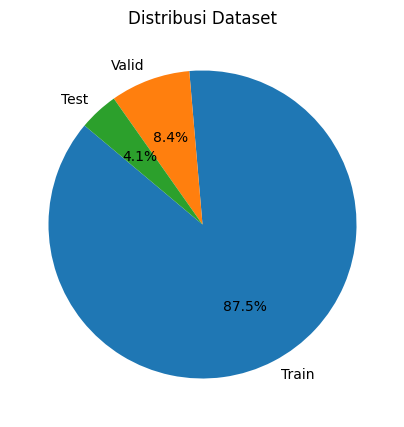

In [6]:
# ============================================================
# CELL 6 — DATASET SUMMARY (FIXED PATH)
# ============================================================

# Fix path Roboflow
train_rel = data_cfg["train"].replace("../", "")
valid_rel = data_cfg["val"].replace("../", "")
test_rel  = data_cfg["test"].replace("../", "")

# Full path
train_path = DATA_DIR / train_rel
valid_path = DATA_DIR / valid_rel
test_path  = DATA_DIR / test_rel

print("=" * 60)
print("            DATASET PATH CHECK")
print("=" * 60)

print(f"Train Path : {train_path}")
print(f"Valid Path : {valid_path}")
print(f"Test Path  : {test_path}")

print("=" * 60)

# Count images
def count_images(folder):

    total = 0

    for ext in ["*.jpg", "*.jpeg", "*.png"]:

        total += len(list(Path(folder).glob(ext)))

    return total

train_count = count_images(train_path)
valid_count = count_images(valid_path)
test_count  = count_images(test_path)

total_count = train_count + valid_count + test_count

print("\n📊 DATASET SUMMARY")
print("=" * 60)

print(f"Train Images : {train_count}")
print(f"Valid Images : {valid_count}")
print(f"Test Images  : {test_count}")

print("-" * 60)

print(f"Total Images : {total_count}")

print("=" * 60)

# Pie chart
plt.figure(figsize=(5,5))

plt.pie(
    [train_count, valid_count, test_count],
    labels=["Train", "Valid", "Test"],
    autopct="%1.1f%%",
    startangle=140
)

plt.title("Distribusi Dataset")

plt.show()

In [8]:
# ============================================================
# CELL 7 — VALIDASI FORMAT LABEL POSE
# ============================================================

# Random sample label dari TRAIN
sample_label = random.choice(
    list((DATA_DIR / "train" / "labels").glob("*.txt"))
)

print("=" * 60)
print("          VALIDASI FORMAT LABEL")
print("=" * 60)

print(f"📄 Sample Label:")
print(sample_label.name)

# Load label
with open(sample_label, "r") as f:

    lines = f.readlines()

print("\n📌 Isi label pertama:\n")

print(lines[0][:300])

values = lines[0].strip().split()

print("\n📊 Statistik Label:")
print(f"Jumlah value : {len(values)}")

# Validasi pose
if len(values) > 10:

    print("✅ Dataset terdeteksi sebagai POSE DATASET")

else:

    print("⚠️ Dataset kemungkinan bukan pose dataset")

          VALIDASI FORMAT LABEL
📄 Sample Label:
image_20241008_202917_jpg.rf.789046235e1e117ee7023035c3d2b0ad.txt

📌 Isi label pertama:

0 0.31875 0.47109375 0.6375 0.76328125 0.3084936996628664 0.761473137639611 2 0.14678437500000002 0.37820140625 2 0.24676770833333334 0.21223390625 2 0.020833333333333332 0.4625 2

📊 Statistik Label:
Jumlah value : 17
✅ Dataset terdeteksi sebagai POSE DATASET


           VISUALISASI KEYPOINT
📷 Image : image_20241008_202917_jpg.rf.789046235e1e117ee7023035c3d2b0ad.jpg
📄 Label : image_20241008_202917_jpg.rf.789046235e1e117ee7023035c3d2b0ad.txt

📊 Total Keypoint Value : 12


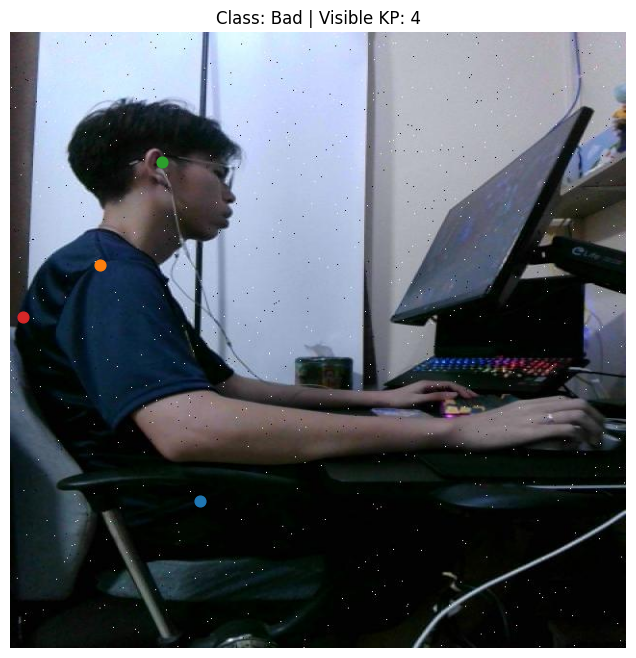


✅ Visible Keypoints : 4


In [9]:
# ============================================================
# CELL 8 — VISUALISASI KEYPOINT POSE
# ============================================================

# Random sample image
sample_img = random.choice(
    list((DATA_DIR / "train" / "images").glob("*.*"))
)

sample_lbl = (
    DATA_DIR / "train" / "labels" / f"{sample_img.stem}.txt"
)

print("=" * 60)
print("           VISUALISASI KEYPOINT")
print("=" * 60)

print(f"📷 Image : {sample_img.name}")
print(f"📄 Label : {sample_lbl.name}")

# Load image
img = cv2.imread(str(sample_img))
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

h, w = img.shape[:2]

# Load label
with open(sample_lbl, "r") as f:

    line = f.readline().strip().split()

values = list(map(float, line))

class_id = int(values[0])

bbox = values[1:5]

keypoints = values[5:]

print(f"\n📊 Total Keypoint Value : {len(keypoints)}")

# Plot image
plt.figure(figsize=(8,8))

plt.imshow(img)

# Draw keypoints
kp_count = 0

for i in range(0, len(keypoints), 3):

    kp_x = keypoints[i]
    kp_y = keypoints[i + 1]
    kp_v = keypoints[i + 2]

    # Skip invisible keypoint
    if kp_v == 0:
        continue

    x = int(kp_x * w)
    y = int(kp_y * h)

    plt.scatter(
        x,
        y,
        s=60
    )

    kp_count += 1

plt.title(
    f"Class: {CLASS_NAMES[class_id]} | Visible KP: {kp_count}"
)

plt.axis("off")

plt.show()

print(f"\n✅ Visible Keypoints : {kp_count}")

            LOAD SAMPLE IMAGE
📷 Image : good_posture_20241021_141454_png.rf.d7da762e5bde110e2e736c424fdbbd03.jpg

📐 Original Shape : (640, 640, 3)


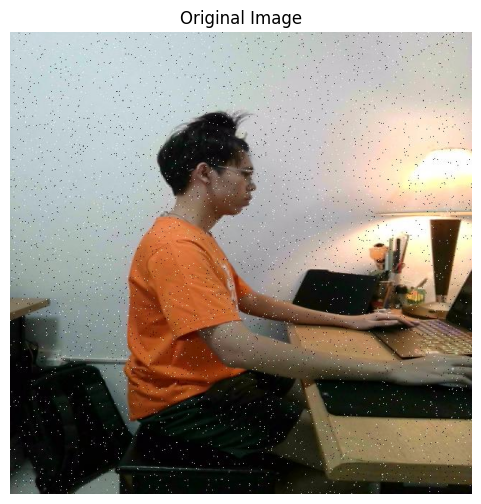

In [10]:
# ============================================================
# CELL 9 — LOAD SAMPLE IMAGE
# ============================================================

# Random sample image
sample_img = random.choice(
    list((DATA_DIR / "train" / "images").glob("*.*"))
)

print("=" * 60)
print("            LOAD SAMPLE IMAGE")
print("=" * 60)

print(f"📷 Image : {sample_img.name}")

# Load image
img_bgr = cv2.imread(str(sample_img))

# Convert BGR → RGB
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

print(f"\n📐 Original Shape : {img_rgb.shape}")

# Display
plt.figure(figsize=(6,6))

plt.imshow(img_rgb)

plt.title("Original Image")

plt.axis("off")

plt.show()

       RESIZE & NORMALIZATION
📐 Resized Shape : (640, 640, 3)


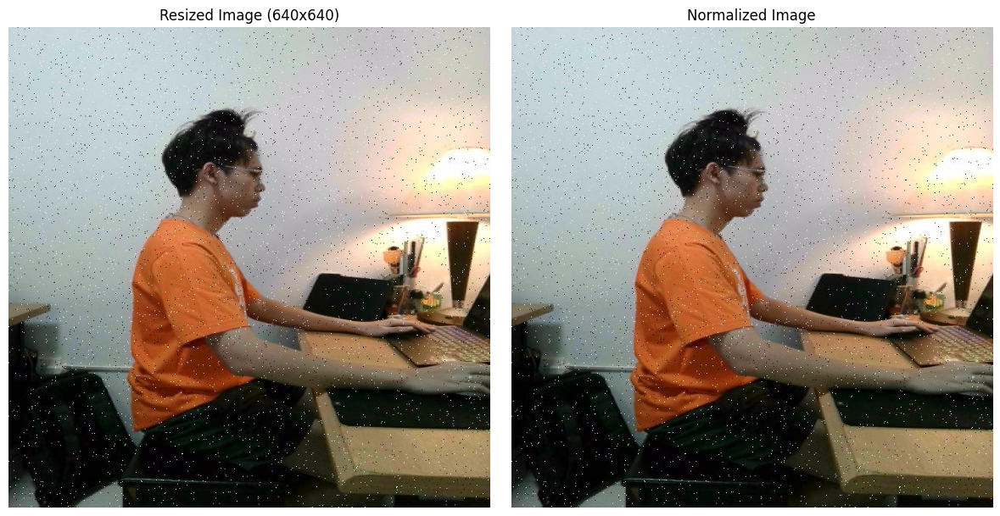

In [11]:
# ============================================================
# CELL 10 — RESIZE & NORMALIZATION
# ============================================================

# Resize image
resized_img = cv2.resize(
    img_rgb,
    (640, 640)
)

# Normalize
normalized_img = resized_img / 255.0

print("=" * 60)
print("       RESIZE & NORMALIZATION")
print("=" * 60)

print(f"📐 Resized Shape : {resized_img.shape}")

# Plot
fig, ax = plt.subplots(1, 2, figsize=(12,6))

# Resized
ax[0].imshow(resized_img)
ax[0].set_title("Resized Image (640x640)")
ax[0].axis("off")

# Normalized
ax[1].imshow(normalized_img)
ax[1].set_title("Normalized Image")
ax[1].axis("off")

plt.tight_layout()
plt.show()

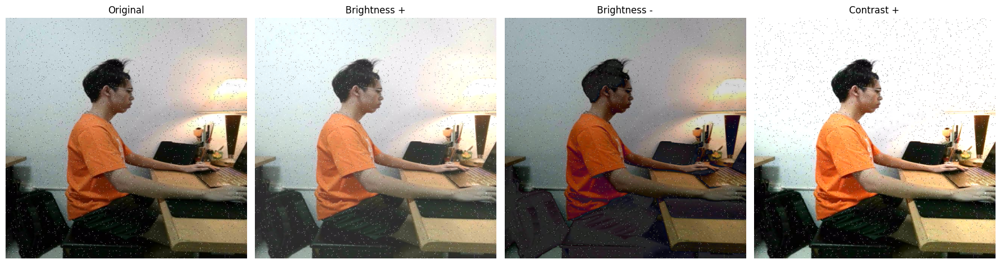

✅ Brightness & Contrast visualization selesai


In [12]:
# ============================================================
# CELL 11 — BRIGHTNESS & CONTRAST
# ============================================================

# Brightness increase
bright_plus = cv2.convertScaleAbs(
    resized_img,
    alpha=1.0,
    beta=40
)

# Brightness decrease
bright_minus = cv2.convertScaleAbs(
    resized_img,
    alpha=1.0,
    beta=-40
)

# Contrast enhancement
contrast_plus = cv2.convertScaleAbs(
    resized_img,
    alpha=1.5,
    beta=0
)

# Plot
fig, ax = plt.subplots(1, 4, figsize=(18,5))

ax[0].imshow(resized_img)
ax[0].set_title("Original")
ax[0].axis("off")

ax[1].imshow(bright_plus)
ax[1].set_title("Brightness +")
ax[1].axis("off")

ax[2].imshow(bright_minus)
ax[2].set_title("Brightness -")
ax[2].axis("off")

ax[3].imshow(contrast_plus)
ax[3].set_title("Contrast +")
ax[3].axis("off")

plt.tight_layout()
plt.show()

print("✅ Brightness & Contrast visualization selesai")

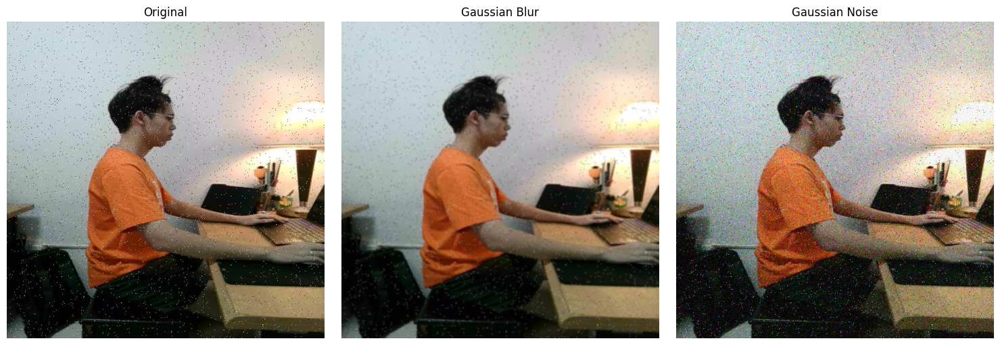

✅ Blur & Noise visualization selesai


In [13]:
# ============================================================
# CELL 12 — BLUR & GAUSSIAN NOISE
# ============================================================

# Gaussian Blur
blur_img = cv2.GaussianBlur(
    resized_img,
    (5,5),
    0
)

# Gaussian Noise
noise = np.random.normal(
    0,
    25,
    resized_img.shape
)

noise_img = resized_img + noise

noise_img = np.clip(
    noise_img,
    0,
    255
).astype(np.uint8)

# Plot
fig, ax = plt.subplots(1, 3, figsize=(15,5))

ax[0].imshow(resized_img)
ax[0].set_title("Original")
ax[0].axis("off")

ax[1].imshow(blur_img)
ax[1].set_title("Gaussian Blur")
ax[1].axis("off")

ax[2].imshow(noise_img)
ax[2].set_title("Gaussian Noise")
ax[2].axis("off")

plt.tight_layout()
plt.show()

print("✅ Blur & Noise visualization selesai")

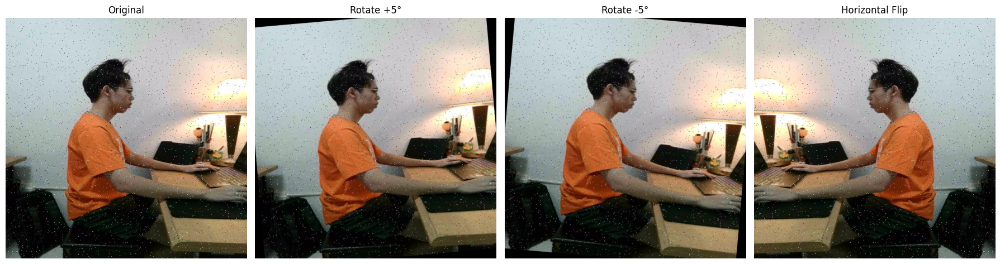

✅ Rotation & Flip visualization selesai


In [14]:
# ============================================================
# CELL 13 — ROTATION & HORIZONTAL FLIP
# ============================================================

(h, w) = resized_img.shape[:2]

center = (w // 2, h // 2)

# Rotate +5
M1 = cv2.getRotationMatrix2D(center, 5, 1.0)

rotate_plus = cv2.warpAffine(
    resized_img,
    M1,
    (w, h)
)

# Rotate -5
M2 = cv2.getRotationMatrix2D(center, -5, 1.0)

rotate_minus = cv2.warpAffine(
    resized_img,
    M2,
    (w, h)
)

# Horizontal Flip
flip_img = cv2.flip(
    resized_img,
    1
)

# Plot
fig, ax = plt.subplots(1, 4, figsize=(18,5))

ax[0].imshow(resized_img)
ax[0].set_title("Original")
ax[0].axis("off")

ax[1].imshow(rotate_plus)
ax[1].set_title("Rotate +5°")
ax[1].axis("off")

ax[2].imshow(rotate_minus)
ax[2].set_title("Rotate -5°")
ax[2].axis("off")

ax[3].imshow(flip_img)
ax[3].set_title("Horizontal Flip")
ax[3].axis("off")

plt.tight_layout()
plt.show()

print("✅ Rotation & Flip visualization selesai")

         VISUALISASI SKELETON
📷 Image : good_posture_20241021_142153_png.rf.53ff9cef124a7c432308ec8797d6b7e9.jpg


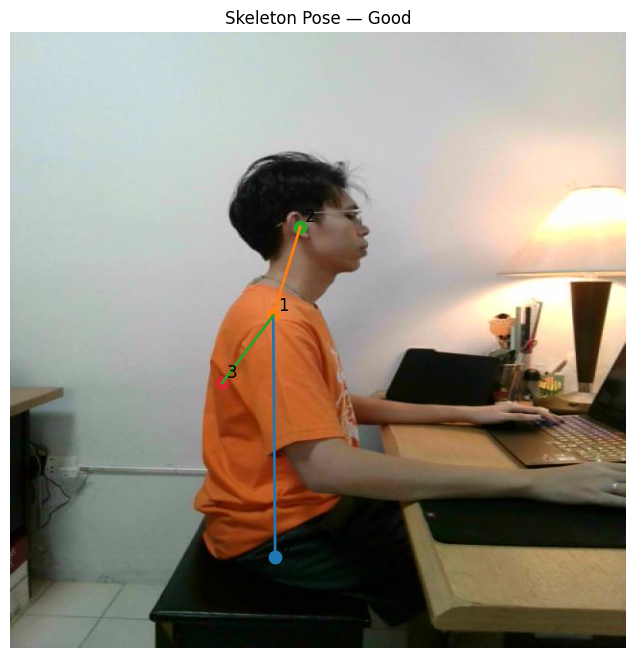


✅ Skeleton visualization selesai


In [15]:
# ============================================================
# CELL 14 — VISUALISASI SKELETON POSE
# ============================================================

# Random sample image
sample_img = random.choice(
    list((DATA_DIR / "train" / "images").glob("*.*"))
)

sample_lbl = (
    DATA_DIR / "train" / "labels" / f"{sample_img.stem}.txt"
)

print("=" * 60)
print("         VISUALISASI SKELETON")
print("=" * 60)

print(f"📷 Image : {sample_img.name}")

# Load image
img = cv2.imread(str(sample_img))
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

h, w = img.shape[:2]

# Load label
with open(sample_lbl, "r") as f:

    line = f.readline().strip().split()

values = list(map(float, line))

class_id = int(values[0])

keypoints = values[5:]

# Convert keypoints
points = []

for i in range(0, len(keypoints), 3):

    kp_x = keypoints[i]
    kp_y = keypoints[i + 1]
    kp_v = keypoints[i + 2]

    x = int(kp_x * w)
    y = int(kp_y * h)

    points.append((x, y, kp_v))

# Skeleton connection
skeleton = [
    (0,1),
    (1,2),
    (1,3)
]

# Plot
plt.figure(figsize=(8,8))

plt.imshow(img)

# Draw points
for idx, (x, y, v) in enumerate(points):

    if v == 0:
        continue

    plt.scatter(x, y, s=80)

    plt.text(
        x + 5,
        y - 5,
        f"{idx}",
        fontsize=12
    )

# Draw skeleton
for p1, p2 in skeleton:

    x1, y1, _ = points[p1]
    x2, y2, _ = points[p2]

    plt.plot(
        [x1, x2],
        [y1, y2],
        linewidth=2
    )

plt.title(
    f"Skeleton Pose — {CLASS_NAMES[class_id]}"
)

plt.axis("off")

plt.show()

print("\n✅ Skeleton visualization selesai")

In [16]:
# ============================================================
# CELL 15 — TAMPILKAN KOORDINAT KEYPOINT
# ============================================================

print("=" * 60)
print("          KOORDINAT KEYPOINT")
print("=" * 60)

for idx, (x, y, v) in enumerate(points):

    print(
        f"Keypoint {idx} "
        f"| X={x} "
        f"| Y={y} "
        f"| Visibility={v}"
    )

          KOORDINAT KEYPOINT
Keypoint 0 | X=275 | Y=545 | Visibility=2.0
Keypoint 1 | X=273 | Y=294 | Visibility=2.0
Keypoint 2 | X=301 | Y=202 | Visibility=2.0
Keypoint 3 | X=220 | Y=364 | Visibility=2.0


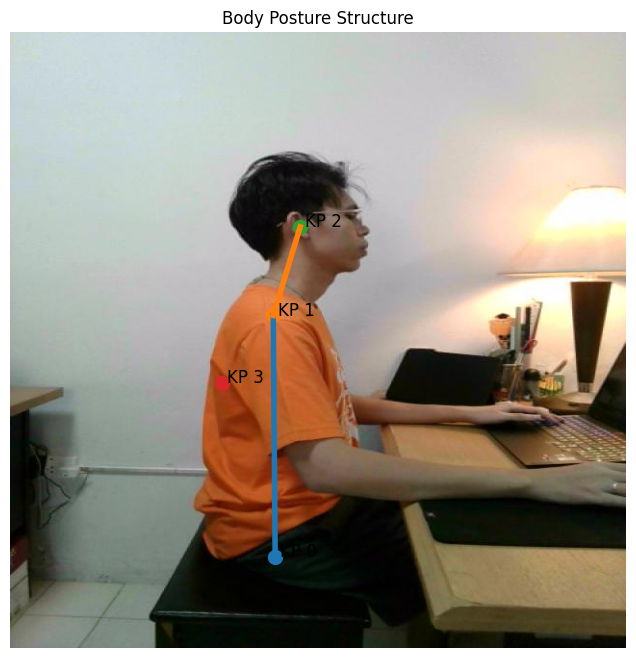

✅ Body posture line visualization selesai


In [17]:
# ============================================================
# CELL 16 — BODY POSTURE LINE
# ============================================================

# Ambil titik utama
x1, y1, _ = points[0]
x2, y2, _ = points[1]
x3, y3, _ = points[2]

plt.figure(figsize=(8,8))

plt.imshow(img)

# Draw torso line
plt.plot(
    [x1, x2],
    [y1, y2],
    linewidth=4
)

# Draw neck line
plt.plot(
    [x2, x3],
    [y2, y3],
    linewidth=4
)

# Draw points
for idx, (x, y, v) in enumerate(points):

    plt.scatter(x, y, s=100)

    plt.text(
        x + 5,
        y,
        f"KP {idx}",
        fontsize=12
    )

plt.title("Body Posture Structure")

plt.axis("off")

plt.show()

print("✅ Body posture line visualization selesai")

In [18]:
# ============================================================
# CELL 17 — JARAK ANTAR KEYPOINT
# ============================================================

import math

def euclidean_distance(p1, p2):

    return math.sqrt(
        (p1[0] - p2[0])**2 +
        (p1[1] - p2[1])**2
    )

print("=" * 60)
print("          DISTANCE ANALYSIS")
print("=" * 60)

for i in range(len(points)-1):

    d = euclidean_distance(
        points[i],
        points[i+1]
    )

    print(
        f"Distance KP{i} ↔ KP{i+1} : {d:.2f}"
    )

          DISTANCE ANALYSIS
Distance KP0 ↔ KP1 : 251.01
Distance KP1 ↔ KP2 : 96.17
Distance KP2 ↔ KP3 : 181.12


In [19]:
# ============================================================
# CELL 18 — HITUNG TORSO ANGLE
# ============================================================

import math

# ============================================================
# Ambil titik torso
# KP0 = Hip
# KP1 = Shoulder
# ============================================================

x1, y1, _ = points[0]
x2, y2, _ = points[1]

# Hitung delta
dx = x2 - x1
dy = y1 - y2

# Sudut terhadap vertical axis
torso_angle = math.degrees(
    math.atan2(abs(dx), abs(dy))
)

print("=" * 60)
print("              TORSO ANGLE")
print("=" * 60)

print(f"📐 Torso Angle : {torso_angle:.2f}°")

# Interpretasi
if torso_angle < 10:

    posture_status = "Good Posture"

elif torso_angle < 20:

    posture_status = "Moderate Lean"

else:

    posture_status = "Slouching"

print(f"🪑 Posture Status : {posture_status}")

              TORSO ANGLE
📐 Torso Angle : 0.46°
🪑 Posture Status : Good Posture


In [20]:
# ============================================================
# CELL 19 — HITUNG NECK ANGLE
# ============================================================

# ============================================================
# KP1 = Shoulder
# KP2 = Head/Neck
# ============================================================

x1, y1, _ = points[1]
x2, y2, _ = points[2]

# Delta
dx = x2 - x1
dy = y1 - y2

# Angle
neck_angle = math.degrees(
    math.atan2(abs(dx), abs(dy))
)

print("=" * 60)
print("               NECK ANGLE")
print("=" * 60)

print(f"📐 Neck Angle : {neck_angle:.2f}°")

# Interpretasi
if neck_angle < 15:

    neck_status = "Neutral Neck"

elif neck_angle < 30:

    neck_status = "Forward Head"

else:

    neck_status = "Severe Forward Head"

print(f"🧠 Neck Status : {neck_status}")

               NECK ANGLE
📐 Neck Angle : 16.93°
🧠 Neck Status : Forward Head


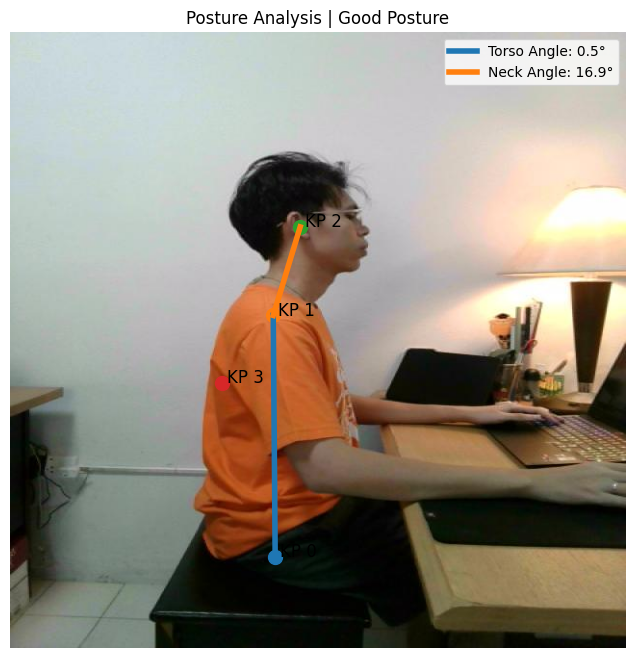

✅ Posture angle visualization selesai


In [21]:
# ============================================================
# CELL 20 — VISUALISASI ANGLE POSTURE
# ============================================================

plt.figure(figsize=(8,8))

plt.imshow(img)

# Draw torso line
plt.plot(
    [points[0][0], points[1][0]],
    [points[0][1], points[1][1]],
    linewidth=4,
    label=f"Torso Angle: {torso_angle:.1f}°"
)

# Draw neck line
plt.plot(
    [points[1][0], points[2][0]],
    [points[1][1], points[2][1]],
    linewidth=4,
    label=f"Neck Angle: {neck_angle:.1f}°"
)

# Draw keypoints
for idx, (x, y, v) in enumerate(points):

    plt.scatter(x, y, s=100)

    plt.text(
        x + 5,
        y,
        f"KP {idx}",
        fontsize=12
    )

plt.legend()

plt.title(
    f"Posture Analysis | {posture_status}"
)

plt.axis("off")

plt.show()

print("✅ Posture angle visualization selesai")

In [22]:
# ============================================================
# CELL 21 — POSTURE SCORING SYSTEM
# ============================================================

print("=" * 60)
print("         POSTURE SCORING SYSTEM")
print("=" * 60)

# ============================================================
# Torso Score
# ============================================================

if torso_angle < 10:

    torso_score = 100

elif torso_angle < 20:

    torso_score = 70

else:

    torso_score = 40

# ============================================================
# Neck Score
# ============================================================

if neck_angle < 15:

    neck_score = 100

elif neck_angle < 30:

    neck_score = 70

else:

    neck_score = 40

# ============================================================
# Final Score
# ============================================================

final_score = (torso_score + neck_score) / 2

print(f"📐 Torso Score : {torso_score}")
print(f"🧠 Neck Score  : {neck_score}")

print("-" * 60)

print(f"🏆 Final Posture Score : {final_score:.1f}/100")

# ============================================================
# Interpretation
# ============================================================

if final_score >= 85:

    final_status = "Excellent Posture"

elif final_score >= 70:

    final_status = "Moderate Posture"

else:

    final_status = "Poor Posture"

print(f"🪑 Final Status : {final_status}")

         POSTURE SCORING SYSTEM
📐 Torso Score : 100
🧠 Neck Score  : 70
------------------------------------------------------------
🏆 Final Posture Score : 85.0/100
🪑 Final Status : Excellent Posture


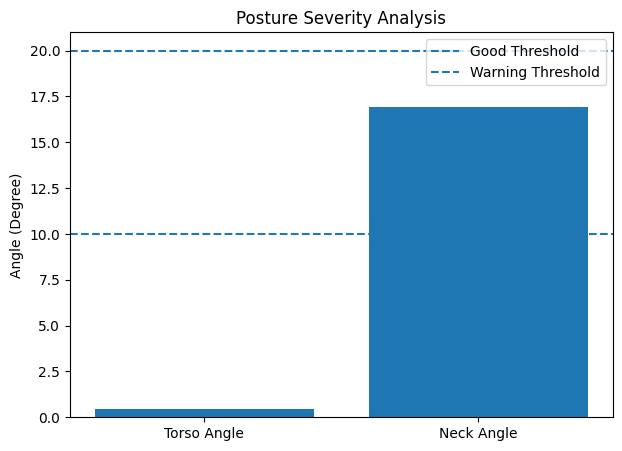

✅ Posture severity visualization selesai


In [23]:
# ============================================================
# CELL 22 — VISUALISASI POSTURE SEVERITY
# ============================================================

metrics = [
    torso_angle,
    neck_angle
]

labels = [
    "Torso Angle",
    "Neck Angle"
]

plt.figure(figsize=(7,5))

bars = plt.bar(
    labels,
    metrics
)

# Threshold lines
plt.axhline(
    y=10,
    linestyle="--",
    label="Good Threshold"
)

plt.axhline(
    y=20,
    linestyle="--",
    label="Warning Threshold"
)

plt.ylabel("Angle (Degree)")

plt.title("Posture Severity Analysis")

plt.legend()

plt.show()

print("✅ Posture severity visualization selesai")

In [24]:
# ============================================================
# CELL 23 — POSTURE DATAFRAME
# ============================================================

posture_df = pd.DataFrame({

    "Torso Angle": [torso_angle],
    "Neck Angle": [neck_angle],
    "Torso Status": [posture_status],
    "Neck Status": [neck_status],
    "Final Score": [final_score],
    "Final Status": [final_status]

})

print("=" * 60)
print("            POSTURE ANALYTICS")
print("=" * 60)

display(posture_df)

            POSTURE ANALYTICS


,Torso Angle,Neck Angle,Torso Status,Neck Status,Final Score,Final Status
0,0.45653,16.927513,Good Posture,Forward Head,85.0,Excellent Posture


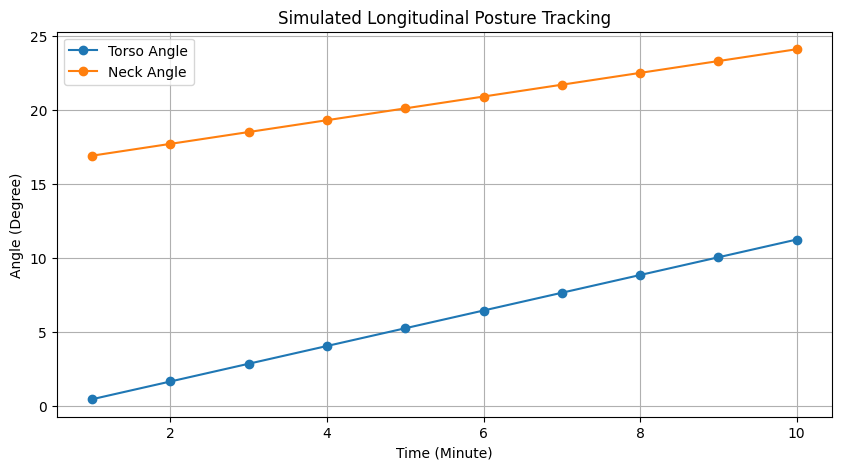

✅ Longitudinal posture simulation selesai


In [25]:
# ============================================================
# CELL 24 — SIMULASI LONGITUDINAL TRACKING
# ============================================================

minutes = list(range(1, 11))

# Simulasi fatigue posture
simulated_torso = [
    torso_angle + i * 1.2
    for i in range(10)
]

simulated_neck = [
    neck_angle + i * 0.8
    for i in range(10)
]

plt.figure(figsize=(10,5))

plt.plot(
    minutes,
    simulated_torso,
    marker="o",
    label="Torso Angle"
)

plt.plot(
    minutes,
    simulated_neck,
    marker="o",
    label="Neck Angle"
)

plt.xlabel("Time (Minute)")
plt.ylabel("Angle (Degree)")

plt.title("Simulated Longitudinal Posture Tracking")

plt.legend()

plt.grid(True)

plt.show()

print("✅ Longitudinal posture simulation selesai")

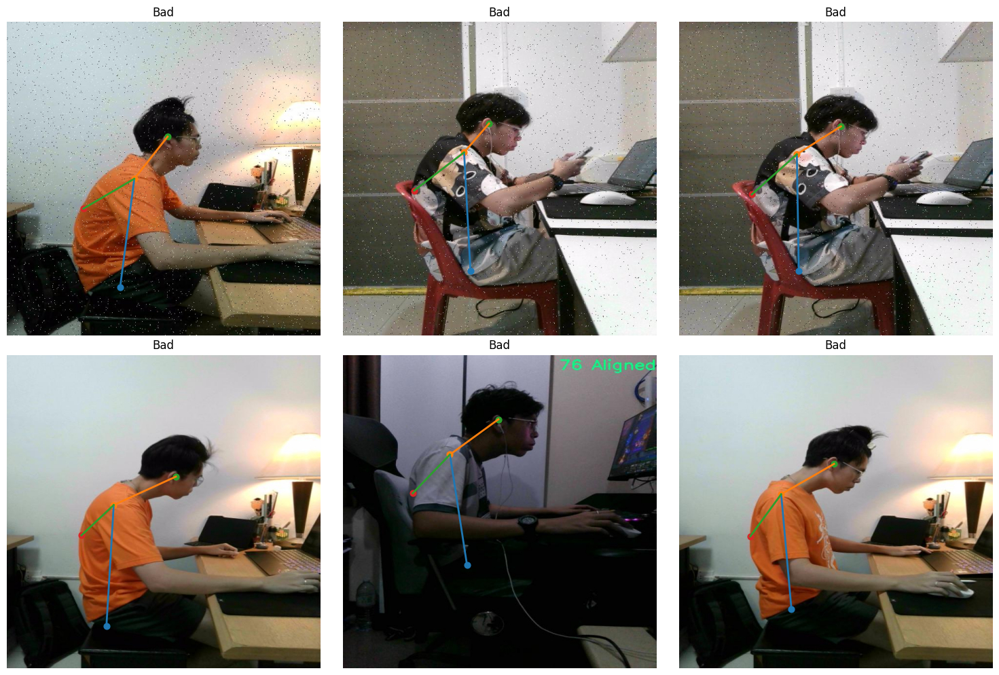

✅ Multi sample pose visualization selesai


In [26]:
# ============================================================
# CELL 25 — MULTI SAMPLE POSE VISUALIZATION
# ============================================================

samples = random.sample(
    list((DATA_DIR / "train" / "images").glob("*.*")),
    6
)

fig, axes = plt.subplots(2, 3, figsize=(15,10))

axes = axes.flatten()

for ax, sample_img in zip(axes, samples):

    sample_lbl = (
        DATA_DIR / "train" / "labels" /
        f"{sample_img.stem}.txt"
    )

    # Load image
    img = cv2.imread(str(sample_img))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    h, w = img.shape[:2]

    # Load label
    with open(sample_lbl, "r") as f:

        line = f.readline().strip().split()

    values = list(map(float, line))

    class_id = int(values[0])

    keypoints = values[5:]

    # Plot image
    ax.imshow(img)

    # Draw keypoints
    points_local = []

    for i in range(0, len(keypoints), 3):

        kp_x = keypoints[i]
        kp_y = keypoints[i + 1]
        kp_v = keypoints[i + 2]

        x = int(kp_x * w)
        y = int(kp_y * h)

        points_local.append((x, y, kp_v))

        if kp_v != 0:

            ax.scatter(x, y, s=40)

    # Skeleton
    skeleton = [
        (0,1),
        (1,2),
        (1,3)
    ]

    for p1, p2 in skeleton:

        x1, y1, _ = points_local[p1]
        x2, y2, _ = points_local[p2]

        ax.plot(
            [x1, x2],
            [y1, y2],
            linewidth=2
        )

    ax.set_title(CLASS_NAMES[class_id])

    ax.axis("off")

plt.tight_layout()

plt.show()

print("✅ Multi sample pose visualization selesai")

          CLASS DISTRIBUTION


,Class,Count
0,Bad,366
1,Good,207


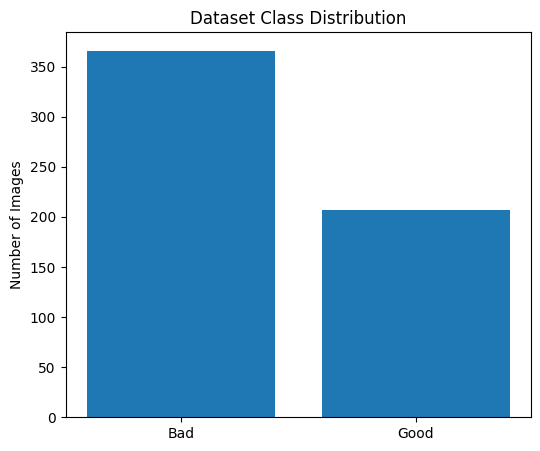

In [27]:
# ============================================================
# CELL 26 — DISTRIBUSI CLASS DATASET
# ============================================================

label_files = list(
    (DATA_DIR / "train" / "labels").glob("*.txt")
)

class_counts = {}

for cls_name in CLASS_NAMES:

    class_counts[cls_name] = 0

# Count class
for lbl_file in label_files:

    with open(lbl_file, "r") as f:

        line = f.readline().strip().split()

    class_id = int(float(line[0]))

    class_name = CLASS_NAMES[class_id]

    class_counts[class_name] += 1

# Dataframe
class_df = pd.DataFrame({

    "Class": list(class_counts.keys()),
    "Count": list(class_counts.values())

})

print("=" * 60)
print("          CLASS DISTRIBUTION")
print("=" * 60)

display(class_df)

# Visualization
plt.figure(figsize=(6,5))

plt.bar(
    class_df["Class"],
    class_df["Count"]
)

plt.title("Dataset Class Distribution")

plt.ylabel("Number of Images")

plt.show()

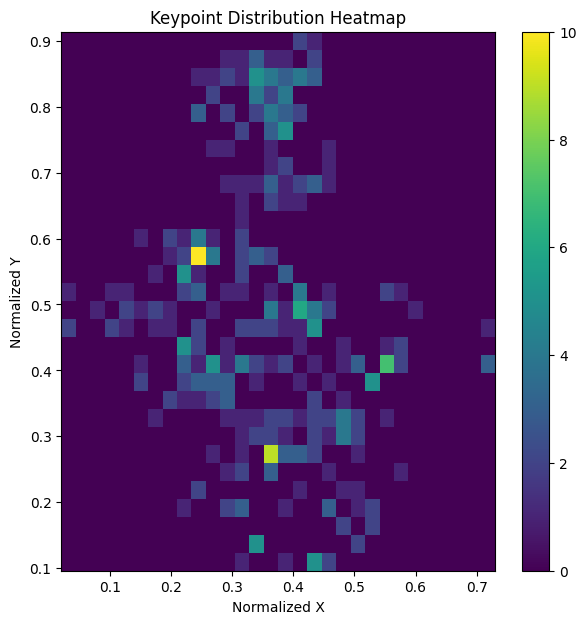

✅ Keypoint heatmap analysis selesai


In [28]:
# ============================================================
# CELL 27 — KEYPOINT HEATMAP ANALYSIS
# ============================================================

all_x = []
all_y = []

sample_labels = random.sample(
    list((DATA_DIR / "train" / "labels").glob("*.txt")),
    min(100, len(list((DATA_DIR / "train" / "labels").glob("*.txt"))))
)

for lbl_file in sample_labels:

    with open(lbl_file, "r") as f:

        line = f.readline().strip().split()

    values = list(map(float, line))

    keypoints = values[5:]

    for i in range(0, len(keypoints), 3):

        kp_x = keypoints[i]
        kp_y = keypoints[i + 1]

        all_x.append(kp_x)
        all_y.append(kp_y)

plt.figure(figsize=(7,7))

plt.hist2d(
    all_x,
    all_y,
    bins=30
)

plt.title("Keypoint Distribution Heatmap")

plt.xlabel("Normalized X")
plt.ylabel("Normalized Y")

plt.colorbar()

plt.show()

print("✅ Keypoint heatmap analysis selesai")

In [29]:
# ============================================================
# CELL 28 — LOAD YOLOv8n-pose MODEL
# ============================================================

print("=" * 60)
print("          LOAD YOLOv8n-pose")
print("=" * 60)

# Load pretrained pose model
model = YOLO("yolov8n-pose.pt")

print("✅ YOLOv8n-pose model berhasil dimuat")

          LOAD YOLOv8n-pose
✅ YOLOv8n-pose model berhasil dimuat


In [30]:
# ============================================================
# CELL 29 — TRAIN YOLOv8n-pose
# ============================================================

print("=" * 60)
print("            TRAINING MODEL")
print("=" * 60)

results = model.train(

    data=str(YAML_PATH),

    epochs=30,

    imgsz=640,

    batch=8,

    device=0,

    project="runs",

    name="posture_pose",

    pretrained=True,

    optimizer="Adam",

    lr0=0.001,

    patience=10,

    workers=2

)

print("\n✅ Training selesai")

            TRAINING MODEL
New https://pypi.org/project/ultralytics/8.4.51 available  Update with 'pip install -U ultralytics'
Ultralytics 8.4.48  Python-3.10.6 torch-2.7.1+cu118 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=D:\cv-posture\data\data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-pose.pt, mo

         TRAINING METRICS ANALYSIS
['epoch', 'time', 'train/box_loss', 'train/pose_loss', 'train/kobj_loss', 'train/cls_loss', 'train/dfl_loss', 'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'metrics/precision(P)', 'metrics/recall(P)', 'metrics/mAP50(P)', 'metrics/mAP50-95(P)', 'val/box_loss', 'val/pose_loss', 'val/kobj_loss', 'val/cls_loss', 'val/dfl_loss', 'lr/pg0', 'lr/pg1', 'lr/pg2']


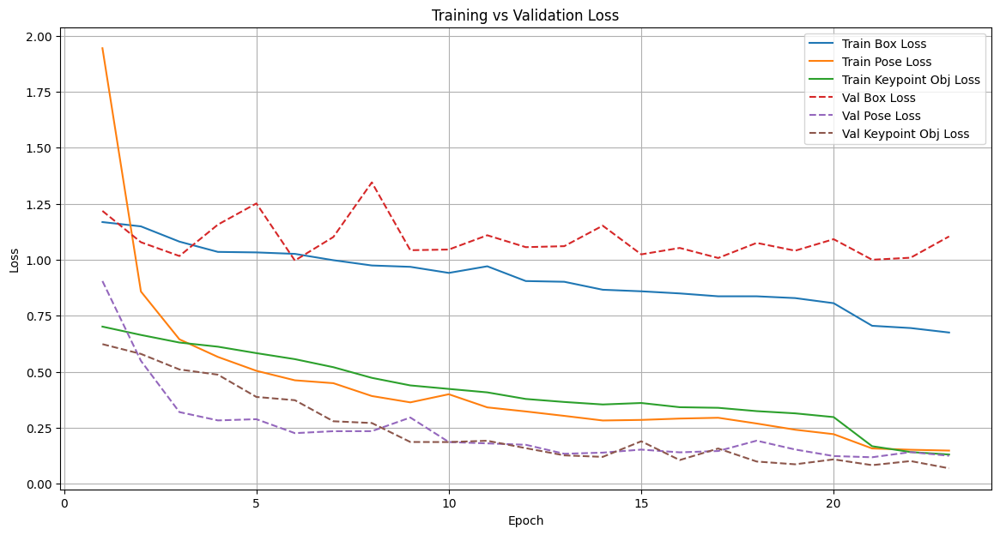

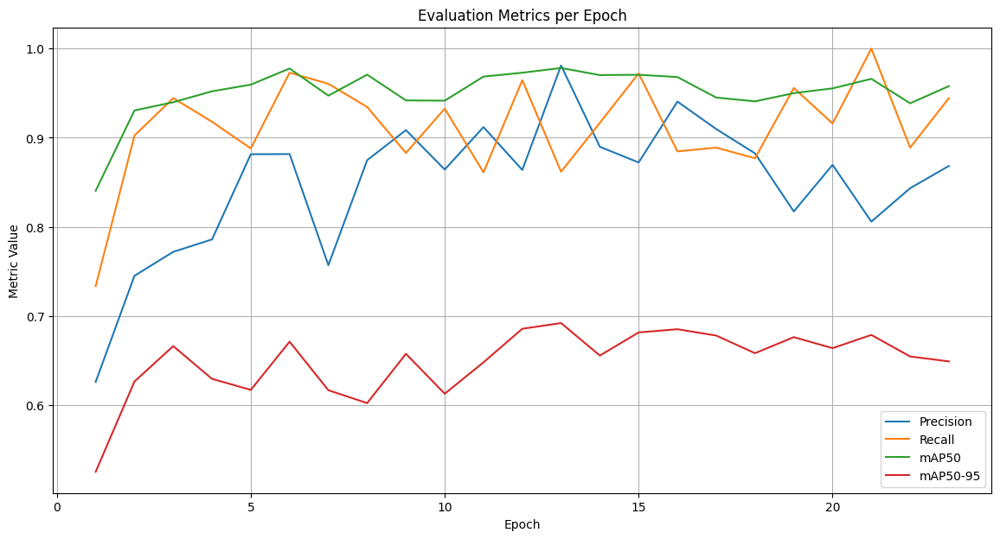

            OVERFITTING CHECK
Final Train Pose Loss : 0.1483
Final Val Pose Loss   : 0.1252
------------------------------------------------------------
Loss Gap : 0.0232
✅ Model cenderung TIDAK overfitting


In [32]:
# ============================================================
# OPTIONAL CELL — TRAINING METRICS & OVERFITTING ANALYSIS
# ============================================================

# File hasil training YOLO
results_csv = "runs/pose/runs/posture_pose/results.csv"

# Load CSV
results_df = pd.read_csv(results_csv)

print("=" * 60)
print("         TRAINING METRICS ANALYSIS")
print("=" * 60)

print(results_df.columns.tolist())

# ============================================================
# PLOT TRAINING CURVES
# ============================================================

plt.figure(figsize=(14,7))

# =========================
# TRAIN LOSSES
# =========================
plt.plot(
    results_df["epoch"],
    results_df["train/box_loss"],
    label="Train Box Loss"
)

plt.plot(
    results_df["epoch"],
    results_df["train/pose_loss"],
    label="Train Pose Loss"
)

plt.plot(
    results_df["epoch"],
    results_df["train/kobj_loss"],
    label="Train Keypoint Obj Loss"
)

# =========================
# VALIDATION LOSSES
# =========================
plt.plot(
    results_df["epoch"],
    results_df["val/box_loss"],
    linestyle="--",
    label="Val Box Loss"
)

plt.plot(
    results_df["epoch"],
    results_df["val/pose_loss"],
    linestyle="--",
    label="Val Pose Loss"
)

plt.plot(
    results_df["epoch"],
    results_df["val/kobj_loss"],
    linestyle="--",
    label="Val Keypoint Obj Loss"
)

plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.title("Training vs Validation Loss")

plt.legend()

plt.grid(True)

plt.show()

# ============================================================
# METRIC CURVES
# ============================================================

plt.figure(figsize=(14,7))

plt.plot(
    results_df["epoch"],
    results_df["metrics/precision(B)"],
    label="Precision"
)

plt.plot(
    results_df["epoch"],
    results_df["metrics/recall(B)"],
    label="Recall"
)

plt.plot(
    results_df["epoch"],
    results_df["metrics/mAP50(B)"],
    label="mAP50"
)

plt.plot(
    results_df["epoch"],
    results_df["metrics/mAP50-95(B)"],
    label="mAP50-95"
)

plt.xlabel("Epoch")
plt.ylabel("Metric Value")

plt.title("Evaluation Metrics per Epoch")

plt.legend()

plt.grid(True)

plt.show()

# ============================================================
# OVERFITTING CHECK
# ============================================================

print("=" * 60)
print("            OVERFITTING CHECK")
print("=" * 60)

final_train_loss = (
    results_df["train/pose_loss"].iloc[-1]
)

final_val_loss = (
    results_df["val/pose_loss"].iloc[-1]
)

loss_gap = abs(
    final_train_loss - final_val_loss
)

print(f"Final Train Pose Loss : {final_train_loss:.4f}")
print(f"Final Val Pose Loss   : {final_val_loss:.4f}")

print("-" * 60)

print(f"Loss Gap : {loss_gap:.4f}")

# ============================================================
# INTERPRETASI
# ============================================================

if loss_gap < 0.5:

    print("✅ Model cenderung TIDAK overfitting")

elif loss_gap < 1.0:

    print("⚠️ Ada indikasi overfitting ringan")

else:

    print("❌ Model kemungkinan overfitting")

In [34]:
# ============================================================
# CELL 30 — LOAD TRAINED MODEL
# ============================================================

best_model_path = (
    "runs/pose/runs/posture_pose/weights/best.pt"
)

trained_model = YOLO(best_model_path)

print("=" * 60)
print("          LOAD TRAINED MODEL")
print("=" * 60)

print(f"📦 Model Path : {best_model_path}")

print("\n✅ Best model berhasil dimuat")

          LOAD TRAINED MODEL
📦 Model Path : runs/pose/runs/posture_pose/weights/best.pt

✅ Best model berhasil dimuat


In [35]:
# ============================================================
# CELL 31 — INFERENCE RANDOM IMAGE
# ============================================================

# Random test image
test_img = random.choice(
    list((DATA_DIR / "test" / "images").glob("*.*"))
)

print("=" * 60)
print("            MODEL INFERENCE")
print("=" * 60)

print(f"📷 Test Image : {test_img.name}")

# Predict
results = trained_model.predict(
    source=str(test_img),
    conf=0.5,
    save=False
)

print("\n✅ Inference selesai")

            MODEL INFERENCE
📷 Test Image : bad_posture_20241021_145205_png.rf.f14d47aa70fa3f230e09d869e2c344a7.jpg

image 1/1 D:\cv-posture\data\test\images\bad_posture_20241021_145205_png.rf.f14d47aa70fa3f230e09d869e2c344a7.jpg: 640x640 1 Bad, 63.0ms
Speed: 5.6ms preprocess, 63.0ms inference, 5.4ms postprocess per image at shape (1, 3, 640, 640)

✅ Inference selesai


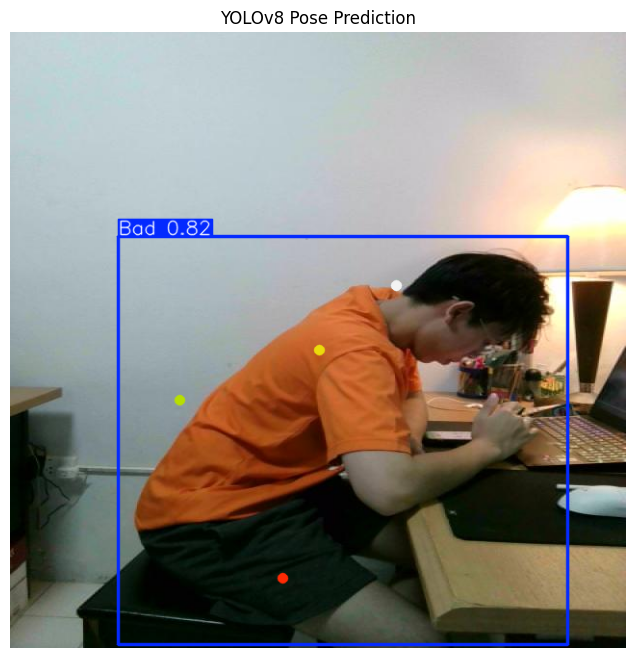

✅ Prediction visualization selesai


In [36]:
# ============================================================
# CELL 32 — VISUALISASI HASIL PREDIKSI
# ============================================================

result = results[0]

annotated_img = result.plot()

annotated_img = cv2.cvtColor(
    annotated_img,
    cv2.COLOR_BGR2RGB
)

plt.figure(figsize=(8,8))

plt.imshow(annotated_img)

plt.title("YOLOv8 Pose Prediction")

plt.axis("off")

plt.show()

print("✅ Prediction visualization selesai")

In [37]:
# ============================================================
# CELL 33 — EKSTRAK KEYPOINT PREDIKSI
# ============================================================

print("=" * 60)
print("         EKSTRAK KEYPOINT AI")
print("=" * 60)

# Keypoints hasil prediksi
pred_kpts = result.keypoints.xy.cpu().numpy()

print(f"📌 Total Detection : {len(pred_kpts)}")

if len(pred_kpts) > 0:

    for idx, kp in enumerate(pred_kpts[0]):

        x, y = kp

        print(
            f"KP {idx} "
            f"| X={x:.2f} "
            f"| Y={y:.2f}"
        )

else:

    print("⚠️ Tidak ada keypoint terdeteksi")

         EKSTRAK KEYPOINT AI
📌 Total Detection : 1
KP 0 | X=283.69 | Y=567.77
KP 1 | X=321.07 | Y=330.60
KP 2 | X=401.50 | Y=263.38
KP 3 | X=176.53 | Y=382.71


In [38]:
# ============================================================
# CELL 34 — ANGLE ANALYSIS DARI AI
# ============================================================

import math

# Ambil keypoint pertama
kp = pred_kpts[0]

# ============================================================
# KP0 = Hip
# KP1 = Shoulder
# KP2 = Head
# ============================================================

x1, y1 = kp[0]
x2, y2 = kp[1]
x3, y3 = kp[2]

# ============================================================
# Torso Angle
# ============================================================

dx = x2 - x1
dy = y1 - y2

torso_angle_ai = math.degrees(
    math.atan2(abs(dx), abs(dy))
)

# ============================================================
# Neck Angle
# ============================================================

dx2 = x3 - x2
dy2 = y2 - y3

neck_angle_ai = math.degrees(
    math.atan2(abs(dx2), abs(dy2))
)

print("=" * 60)
print("         AI POSTURE ANALYSIS")
print("=" * 60)

print(f"📐 Torso Angle : {torso_angle_ai:.2f}°")
print(f"🧠 Neck Angle  : {neck_angle_ai:.2f}°")

         AI POSTURE ANALYSIS
📐 Torso Angle : 8.96°
🧠 Neck Angle  : 50.12°
